# QSS data analysis and plots

The experimental and simulation arrays used by the QSS performance plots are loaded directly from the Excel files in the **QSS_Data/** directory next to this notebook.


In [1]:
import os
import sys
import matplotlib
import numpy as np
import random
import scipy.signal
from scipy.stats import moment
matplotlib.use("Agg")
from matplotlib import pyplot as plt
%matplotlib inline
from tabulate import tabulate
from sklearn import preprocessing
import pandas as pd
import numpy as np
from mpmath import *
from scipy import stats
from itertools import combinations
import math

In [2]:
from matplotlib import rc

rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
rc('text', usetex=True)

matplotlib.rcParams.update({'font.size': 13})
matplotlib.rcParams.update({"figure.dpi": 800})

In [3]:
# ---------------------------------------------------------------------------
# Load all experimental/simulation data from the extracted Excel workbooks.
#
# Expected repository layout:
#
#   QSS_Plots.ipynb
#   QSS_Data/
#       MCM_SIM.xlsx
#       ...
#
#
# ---------------------------------------------------------------------------

from pathlib import Path

QSS_DATA_DIR = Path.cwd() / "QSS_Data"

if not QSS_DATA_DIR.is_dir():
    raise FileNotFoundError(
        f"Expected extracted QSS_data directory at: {QSS_DATA_DIR}\n"
        "Extract/place the 'QSS_Data' folder next to QSS_Plots.ipynb."
    )

print(f"Loading QSS_data from: {QSS_DATA_DIR}")


def _read_qss_excel(filename):
    """Read the 'arrays' sheet from one workbook in the extracted QSS_Data folder."""
    path = QSS_DATA_DIR / filename
    if not path.is_file():
        raise FileNotFoundError(f"Missing workbook: {path}")
    return pd.read_excel(path, sheet_name="arrays", engine="openpyxl")


def _run_values(row):
    """Return the five run values from a workbook row as Python floats."""
    run_columns = [
        col for col in row.index
        if isinstance(col, (int, np.integer))
        or (isinstance(col, str) and col.isdigit())
    ]
    run_columns = sorted(run_columns, key=lambda col: int(col))
    values = [float(row[col]) for col in run_columns]

    if len(values) != 5:
        raise ValueError(
            f"Expected five run columns, found {len(values)} in row:\n{row}"
        )
    return values


DATA_TABLES = {}


def _load_threshold_workbook(filename, *, ent_fid=False, dcm=False, real=False):
    """Publish workbook rows using the variable names expected by the plot cells."""
    df = _read_qss_excel(filename)
    DATA_TABLES[filename] = df.copy()

    for _, row in df.iterrows():
        backend = str(row["Backend"]).strip().lower()
        code = int(row["((k,n))"])
        opt_level = int(row["Opti. Lvl"])

        prefix = "ent_fid_" if ent_fid else ""
        variable_name = f"{prefix}{backend}_{code}_opti_{opt_level}"

        if real and dcm:
            variable_name += "_real_DCM"
        elif real:
            variable_name += "_real"
        elif dcm:
            variable_name += "_DCM"

        globals()[variable_name] = _run_values(row)


# Standard MCM/DCM SWAP-test and entanglement-fidelity data.
_load_threshold_workbook("MCM_SIM.xlsx")
_load_threshold_workbook("DCM_SIM.xlsx", dcm=True)
_load_threshold_workbook("ENT_FID_MCM_SIM.xlsx", ent_fid=True)
_load_threshold_workbook("ENT_FID_DCM_SIM.xlsx", ent_fid=True, dcm=True)

_load_threshold_workbook("MCM_IBMQ.xlsx", real=True)
_load_threshold_workbook("DCM_IBMQ.xlsx", real=True, dcm=True)
_load_threshold_workbook("ENT_FID_MCM_IMBQ.xlsx", ent_fid=True, real=True)
_load_threshold_workbook(
    "ENT_FID_DCM_IBMQ.xlsx",
    ent_fid=True,
    real=True,
    dcm=True,
)


# Steane three-erasure SWAP-test data.
_steane_swap = _read_qss_excel("Steane3Erasures_SIM_IBMQ_MCM.xlsx")
DATA_TABLES["Steane3Erasures_SIM_IBMQ_MCM.xlsx"] = _steane_swap.copy()

for _, row in _steane_swap.iterrows():
    opt_level = int(row["Opti Lvl."])
    metric = str(row["Metric"]).strip().upper()
    variable_name = f"bris_47_opti_{opt_level}"
    if metric == "IBMQ":
        variable_name += "_real"
    elif metric != "SIM":
        raise ValueError(f"Unexpected Steane SWAP metric: {metric}")
    globals()[variable_name] = _run_values(row)


# Steane three-erasure entanglement-fidelity data.
_steane_ent = _read_qss_excel("Steane3Erasures_ENT_FID_SIM_MCM.xlsx")
DATA_TABLES["Steane3Erasures_ENT_FID_SIM_MCM.xlsx"] = _steane_ent.copy()

for _, row in _steane_ent.iterrows():
    backend = str(row["Backend"]).strip()
    opt_level = int(row["Opti. Lvl"])
    authorization = str(
        row["Authorization (complement of erased set)"]
    ).strip().lower()

    if backend.lower().startswith("n/a"):
        variable_name = f"ent_fid_47_opti_{opt_level}_unauth_ideal"
    else:
        backend = backend.lower()
        variable_name = f"ent_fid_{backend}_47_opti_{opt_level}"
        if authorization == "unauth":
            variable_name += "_unauth"
        elif authorization != "auth":
            raise ValueError(
                f"Unexpected authorization label: {authorization}"
            )

    globals()[variable_name] = _run_values(row)


print(f"Loaded {len(DATA_TABLES)} Excel workbooks.")
print("All plotted experimental/simulation arrays come directly from QSS_Data.")


Loading QSS_data from: C:\Users\JGraves\Downloads\QSS_Repo\QSS_Data
Loaded 10 Excel workbooks.
All plotted experimental/simulation arrays come directly from QSS_Data.


In [4]:
#################################################################################################################################
#################################################################################################################################
#################################################################################################################################
#################################################################################################################################
#################################################################################################################################
#################################################################################################################################

In [5]:
plt.close("all")
scheme = ("((3,5)) MCM SIM", "((5,7)) MCM SIM", "((3,5)) DCM SIM", "((5,7)) DCM SIM" ,"((2,3)) SIM")


qss_means = {
    'OL: 0':            (stats.tmean(tor_35_opti_0), stats.tmean(tor_57_opti_0), stats.tmean(tor_35_opti_0_DCM), stats.tmean(tor_57_opti_0_DCM), stats.tmean(tor_23_opti_0)),
    'OL: 1':            (stats.tmean(tor_35_opti_1), stats.tmean(tor_57_opti_1), stats.tmean(tor_35_opti_1_DCM), stats.tmean(tor_57_opti_1_DCM), stats.tmean(tor_23_opti_1)),
    'OL: 2':            (stats.tmean(tor_35_opti_2), stats.tmean(tor_57_opti_2), stats.tmean(tor_35_opti_2_DCM), stats.tmean(tor_57_opti_2_DCM), stats.tmean(tor_23_opti_2)),
    'OL: 3':            (stats.tmean(tor_35_opti_3), stats.tmean(tor_57_opti_3), stats.tmean(tor_35_opti_3_DCM), stats.tmean(tor_57_opti_3_DCM), stats.tmean(tor_23_opti_3))
}

sem = {
    'OL: 0':            (stats.sem(bris_35_opti_0), stats.sem(bris_57_opti_0), stats.sem(bris_23_opti_0)),
    'OL: 1':            (stats.sem(bris_35_opti_1), stats.sem(bris_57_opti_1), stats.sem(bris_23_opti_1)),
    'OL: 2':            (stats.sem(bris_35_opti_2), stats.sem(bris_57_opti_2), stats.sem(bris_23_opti_2)),
    'OL: 3':            (stats.sem(bris_35_opti_3), stats.sem(bris_57_opti_3), stats.sem(bris_23_opti_3))
}

conf_int = {
    'OL: 0':            (stats.sem(tor_35_opti_0)*2.576, stats.sem(tor_57_opti_0)*2.576, stats.sem(tor_35_opti_0_DCM)*2.576, stats.sem(tor_57_opti_0_DCM)*2.576, stats.sem(tor_23_opti_0)*2.576),
    'OL: 1':            (stats.sem(tor_35_opti_1)*2.576, stats.sem(tor_57_opti_1)*2.576, stats.sem(tor_35_opti_1_DCM)*2.576, stats.sem(tor_57_opti_1_DCM)*2.576, stats.sem(tor_23_opti_1)*2.576),
    'OL: 2':            (stats.sem(tor_35_opti_2)*2.576, stats.sem(tor_57_opti_2)*2.576, stats.sem(tor_35_opti_2_DCM)*2.576, stats.sem(tor_57_opti_2_DCM)*2.576, stats.sem(tor_23_opti_2)*2.576),
    'OL: 3':            (stats.sem(tor_35_opti_3)*2.576, stats.sem(tor_57_opti_3)*2.576, stats.sem(tor_35_opti_3_DCM)*2.576, stats.sem(tor_57_opti_3_DCM)*2.576, stats.sem(tor_23_opti_3)*2.576)
}

keys = list(qss_means)

x = np.arange(len(scheme))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0
hatches = ['/', '+', 'x', 'o']
#colors = ['white', 'lightgray', 'silver', 'darkgray', 'dimgray', 'black']
colors = ['white', 'lightgray', 'darkgray', 'dimgray', 'black']
#colors = ['darkblue', 'goldenrod', 'darkgreen', 'darkred']

fig, ax = plt.subplots(figsize=(10, 8), layout='constrained')

for attribute, measurement in qss_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, capsize=3, yerr=conf_int[attribute], 
                   color=colors[list(qss_means.keys()).index(attribute)], edgecolor='black')
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1
    
#hatch=hatches[list(qss_means.keys()).index(attribute)]

ax.set_title('$P(Success)$ for QSS Schemes', fontsize=17)
ax.axhline(1, linestyle='--', color='black')
ax.text(0.05, 0.92, "Ideal value (Noiseless)",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.text(0.86, 0.87, "‘ibm_torino'",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.set_ylabel(r"Rate of Passing the SWAP Test $P(|0 \rangle)$", fontsize=17)
ax.set_xticks(x + width + 0.075, scheme, fontsize=15, rotation=20, ha="right", rotation_mode="anchor")
ax.legend(loc='best', ncols=4, fontsize="15")
ax.set_ylim(0, 1.1)
plt.show()
#fig.savefig('SWAP_TOR.png', bbox_inches='tight', dpi=800)

In [6]:
plt.close("all")
scheme = ("((3,5)) MCM SIM", "((5,7)) MCM SIM", "((3,5)) DCM SIM", "((5,7)) DCM SIM" ,"((2,3)) SIM")


qss_means = {
    'OL: 0':            (stats.tmean(ent_fid_tor_35_opti_0), stats.tmean(ent_fid_tor_57_opti_0), stats.tmean(ent_fid_tor_35_opti_0_DCM), stats.tmean(ent_fid_tor_57_opti_0_DCM), stats.tmean(ent_fid_tor_23_opti_0)),
    'OL: 1':            (stats.tmean(ent_fid_tor_35_opti_1), stats.tmean(ent_fid_tor_57_opti_1), stats.tmean(ent_fid_tor_35_opti_1_DCM), stats.tmean(ent_fid_tor_57_opti_1_DCM), stats.tmean(ent_fid_tor_23_opti_1)),
    'OL: 2':            (stats.tmean(ent_fid_tor_35_opti_2), stats.tmean(ent_fid_tor_57_opti_2), stats.tmean(ent_fid_tor_35_opti_2_DCM), stats.tmean(ent_fid_tor_57_opti_2_DCM), stats.tmean(ent_fid_tor_23_opti_2)),
    'OL: 3':            (stats.tmean(ent_fid_tor_35_opti_3), stats.tmean(ent_fid_tor_57_opti_3), stats.tmean(ent_fid_tor_35_opti_3_DCM), stats.tmean(ent_fid_tor_57_opti_3_DCM), stats.tmean(ent_fid_tor_23_opti_3))
}

sem = {
    'OL: 0':            (stats.sem(bris_35_opti_0), stats.sem(bris_57_opti_0), stats.sem(bris_23_opti_0)),
    'OL: 1':            (stats.sem(bris_35_opti_1), stats.sem(bris_57_opti_1), stats.sem(bris_23_opti_1)),
    'OL: 2':            (stats.sem(bris_35_opti_2), stats.sem(bris_57_opti_2), stats.sem(bris_23_opti_2)),
    'OL: 3':            (stats.sem(bris_35_opti_3), stats.sem(bris_57_opti_3), stats.sem(bris_23_opti_3))
}

conf_int = {
    'OL: 0':            (stats.sem(ent_fid_tor_35_opti_0)*2.576, stats.sem(ent_fid_tor_57_opti_0)*2.576, stats.sem(ent_fid_tor_35_opti_0_DCM)*2.576, stats.sem(ent_fid_tor_57_opti_0_DCM)*2.576, stats.sem(ent_fid_tor_23_opti_0)*2.576),
    'OL: 1':            (stats.sem(ent_fid_tor_35_opti_1)*2.576, stats.sem(ent_fid_tor_57_opti_1)*2.576, stats.sem(ent_fid_tor_35_opti_1_DCM)*2.576, stats.sem(ent_fid_tor_57_opti_1_DCM)*2.576, stats.sem(ent_fid_tor_23_opti_1)*2.576),
    'OL: 2':            (stats.sem(ent_fid_tor_35_opti_2)*2.576, stats.sem(ent_fid_tor_57_opti_2)*2.576, stats.sem(ent_fid_tor_35_opti_2_DCM)*2.576, stats.sem(ent_fid_tor_57_opti_2_DCM)*2.576, stats.sem(ent_fid_tor_23_opti_2)*2.576),
    'OL: 3':            (stats.sem(ent_fid_tor_35_opti_3)*2.576, stats.sem(ent_fid_tor_57_opti_3)*2.576, stats.sem(ent_fid_tor_35_opti_3_DCM)*2.576, stats.sem(ent_fid_tor_57_opti_3_DCM)*2.576, stats.sem(ent_fid_tor_23_opti_3)*2.576)
}

keys = list(qss_means)

x = np.arange(len(scheme))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0
hatches = ['/', '+', 'x', 'o']
#colors = ['white', 'lightgray', 'silver', 'darkgray', 'dimgray', 'black']
colors = ['white', 'lightgray', 'darkgray', 'dimgray', 'black']
#colors = ['darkblue', 'goldenrod', 'darkgreen', 'darkred']

fig, ax = plt.subplots(figsize=(10, 8), layout='constrained')

for attribute, measurement in qss_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, capsize=3, yerr=conf_int[attribute], 
                   color=colors[list(qss_means.keys()).index(attribute)], edgecolor='black')
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1
    
#hatch=hatches[list(qss_means.keys()).index(attribute)]

ax.set_title('Entanglement Fidelity for QSS Schemes', fontsize=17)
ax.axhline(1, linestyle='--', color='black')
ax.text(0.05, 0.92, r"$\sim$ Ideal value (Noiseless)",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.text(0.86, 0.87, "‘ibm_torino'",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.set_ylabel("Entanglement Fidelity", fontsize=17)
ax.set_xticks(x + width + 0.075, scheme, fontsize=15, rotation=20, ha="right", rotation_mode="anchor")
ax.legend(loc='best', ncols=4, fontsize="15")
ax.set_ylim(0, 1.1)
plt.show()
#fig.savefig('ENT_TOR.png', bbox_inches='tight', dpi=800)

In [7]:
###########################################################################################################

###########################################################################################################

###########################################################################################################

In [8]:
plt.close("all")
scheme = ("((3,5)) MCM SIM", "((5,7)) MCM SIM", "((2,3)) SIM", "((3,5)) MCM IBMQ", "((5,7)) MCM IBMQ", "((2,3)) IBMQ")


qss_means = {
    'OL: 0':            (stats.tmean(bris_35_opti_0), stats.tmean(bris_57_opti_0), stats.tmean(bris_23_opti_0), stats.tmean(bris_35_opti_0_real), stats.tmean(bris_57_opti_0_real), stats.tmean(bris_23_opti_0_real)),
    'OL: 1':            (stats.tmean(bris_35_opti_1), stats.tmean(bris_57_opti_1), stats.tmean(bris_23_opti_1), stats.tmean(bris_35_opti_1_real), stats.tmean(bris_57_opti_1_real), stats.tmean(bris_23_opti_1_real)),
    'OL: 2':            (stats.tmean(bris_35_opti_2), stats.tmean(bris_57_opti_2), stats.tmean(bris_23_opti_2), stats.tmean(bris_35_opti_2_real), stats.tmean(bris_57_opti_2_real), stats.tmean(bris_23_opti_2_real)),
    'OL: 3':            (stats.tmean(bris_35_opti_3), stats.tmean(bris_57_opti_3), stats.tmean(bris_23_opti_3), stats.tmean(bris_35_opti_3_real), stats.tmean(bris_57_opti_3_real), stats.tmean(bris_23_opti_3_real))
}

sem = {
    'OL: 0':            (stats.sem(bris_35_opti_0), stats.sem(bris_57_opti_0), stats.sem(bris_23_opti_0)),
    'OL: 1':            (stats.sem(bris_35_opti_1), stats.sem(bris_57_opti_1), stats.sem(bris_23_opti_1)),
    'OL: 2':            (stats.sem(bris_35_opti_2), stats.sem(bris_57_opti_2), stats.sem(bris_23_opti_2)),
    'OL: 3':            (stats.sem(bris_35_opti_3), stats.sem(bris_57_opti_3), stats.sem(bris_23_opti_3))
}

conf_int = {
    'OL: 0':            (stats.sem(bris_35_opti_0)*2.576, stats.sem(bris_57_opti_0)*2.576, stats.sem(bris_23_opti_0)*2.576, stats.sem(bris_35_opti_0_real)*2.576, stats.sem(bris_57_opti_0_real)*2.576, stats.sem(bris_23_opti_0_real)*2.576),
    'OL: 1':            (stats.sem(bris_35_opti_1)*2.576, stats.sem(bris_57_opti_1)*2.576, stats.sem(bris_23_opti_1)*2.576, stats.sem(bris_35_opti_1_real)*2.576, stats.sem(bris_57_opti_1_real)*2.576, stats.sem(bris_23_opti_1_real)*2.576),
    'OL: 2':            (stats.sem(bris_35_opti_2)*2.576, stats.sem(bris_57_opti_2)*2.576, stats.sem(bris_23_opti_2)*2.576, stats.sem(bris_35_opti_2_real)*2.576, stats.sem(bris_57_opti_2_real)*2.576, stats.sem(bris_23_opti_2_real)*2.576),
    'OL: 3':            (stats.sem(bris_35_opti_3)*2.576, stats.sem(bris_57_opti_3)*2.576, stats.sem(bris_23_opti_3)*2.576, stats.sem(bris_35_opti_3_real)*2.576, stats.sem(bris_57_opti_3_real)*2.576, stats.sem(bris_23_opti_3_real)*2.576)
}

keys = list(qss_means)

x = np.arange(len(scheme))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0
hatches = ['/', '+', 'x', 'o']
#colors = ['white', 'lightgray', 'silver', 'darkgray', 'dimgray', 'black']
colors = ['white', 'lightgray', 'darkgray', 'dimgray', 'black']
#colors = ['darkblue', 'goldenrod', 'darkgreen', 'darkred']

fig, ax = plt.subplots(figsize=(10, 8), layout='constrained')

for attribute, measurement in qss_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, capsize=3, yerr=conf_int[attribute], 
                   color=colors[list(qss_means.keys()).index(attribute)], edgecolor='black')
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1
    
#hatch=hatches[list(qss_means.keys()).index(attribute)]

ax.set_title('$P(Success)$ for QSS Schemes (MCM)', fontsize=17)
ax.axhline(1, linestyle='--', color='black')
ax.text(0.05, 0.92, "Ideal value (Noiseless)",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.text(0.86, 0.87, "‘ibm_brisbane'",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.set_ylabel(r"Rate of Passing the SWAP Test $P(|0 \rangle)$", fontsize=17)
ax.set_xticks(x + width + 0.075, scheme, fontsize=12, rotation=20, ha="right", rotation_mode="anchor")
ax.legend(loc='best', ncols=4, fontsize=15)
ax.set_ylim(0, 1.1)
plt.show()
#fig.savefig('SWAP_BRIS_MCM.png', bbox_inches='tight', dpi=800)

In [9]:
plt.close("all")
scheme = ("((3,5)) DCM SIM", "((5,7)) DCM SIM", "((2,3)) SIM", "((3,5)) DCM IBMQ", "((5,7)) DCM IBMQ", "((2,3)) IBMQ")


qss_means = {
    'OL: 0':            (stats.tmean(bris_35_opti_0_DCM), stats.tmean(bris_57_opti_0_DCM), stats.tmean(bris_23_opti_0), stats.tmean(bris_35_opti_0_real_DCM), stats.tmean(bris_57_opti_0_real_DCM), stats.tmean(bris_23_opti_0_real)),
    'OL: 1':            (stats.tmean(bris_35_opti_1_DCM), stats.tmean(bris_57_opti_1_DCM), stats.tmean(bris_23_opti_1), stats.tmean(bris_35_opti_1_real_DCM), stats.tmean(bris_57_opti_1_real_DCM), stats.tmean(bris_23_opti_1_real)),
    'OL: 2':            (stats.tmean(bris_35_opti_2_DCM), stats.tmean(bris_57_opti_2_DCM), stats.tmean(bris_23_opti_2), stats.tmean(bris_35_opti_2_real_DCM), stats.tmean(bris_57_opti_2_real_DCM), stats.tmean(bris_23_opti_2_real)),
    'OL: 3':            (stats.tmean(bris_35_opti_3_DCM), stats.tmean(bris_57_opti_3_DCM), stats.tmean(bris_23_opti_3), stats.tmean(bris_35_opti_3_real_DCM), stats.tmean(bris_57_opti_3_real_DCM), stats.tmean(bris_23_opti_3_real))
}

sem = {
    'OL: 0':            (stats.sem(bris_35_opti_0), stats.sem(bris_57_opti_0), stats.sem(bris_23_opti_0)),
    'OL: 1':            (stats.sem(bris_35_opti_1), stats.sem(bris_57_opti_1), stats.sem(bris_23_opti_1)),
    'OL: 2':            (stats.sem(bris_35_opti_2), stats.sem(bris_57_opti_2), stats.sem(bris_23_opti_2)),
    'OL: 3':            (stats.sem(bris_35_opti_3), stats.sem(bris_57_opti_3), stats.sem(bris_23_opti_3))
}

conf_int = {
    'OL: 0':            (stats.sem(bris_35_opti_0_DCM)*2.576, stats.sem(bris_57_opti_0_DCM)*2.576, stats.sem(bris_23_opti_0)*2.576, stats.sem(bris_35_opti_0_real_DCM)*2.576, stats.sem(bris_57_opti_0_real_DCM)*2.576, stats.sem(bris_23_opti_0_real)*2.576),
    'OL: 1':            (stats.sem(bris_35_opti_1_DCM)*2.576, stats.sem(bris_57_opti_1_DCM)*2.576, stats.sem(bris_23_opti_1)*2.576, stats.sem(bris_35_opti_1_real_DCM)*2.576, stats.sem(bris_57_opti_1_real_DCM)*2.576, stats.sem(bris_23_opti_1_real)*2.576),
    'OL: 2':            (stats.sem(bris_35_opti_2_DCM)*2.576, stats.sem(bris_57_opti_2_DCM)*2.576, stats.sem(bris_23_opti_2)*2.576, stats.sem(bris_35_opti_2_real_DCM)*2.576, stats.sem(bris_57_opti_2_real_DCM)*2.576, stats.sem(bris_23_opti_2_real)*2.576),
    'OL: 3':            (stats.sem(bris_35_opti_3_DCM)*2.576, stats.sem(bris_57_opti_3_DCM)*2.576, stats.sem(bris_23_opti_3)*2.576, stats.sem(bris_35_opti_3_real_DCM)*2.576, stats.sem(bris_57_opti_3_real_DCM)*2.576, stats.sem(bris_23_opti_3_real)*2.576)
}

keys = list(qss_means)

x = np.arange(len(scheme))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0
hatches = ['/', '+', 'x', 'o']
#colors = ['white', 'lightgray', 'silver', 'darkgray', 'dimgray', 'black']
colors = ['white', 'lightgray', 'darkgray', 'dimgray', 'black']
#colors = ['darkblue', 'goldenrod', 'darkgreen', 'darkred']

fig, ax = plt.subplots(figsize=(10, 8), layout='constrained')

for attribute, measurement in qss_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, capsize=3, yerr=conf_int[attribute], 
                   color=colors[list(qss_means.keys()).index(attribute)], edgecolor='black')
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1
    
#hatch=hatches[list(qss_means.keys()).index(attribute)]

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_title('$P(Success)$ for QSS Schemes (DCM)', fontsize=17)
ax.axhline(1, linestyle='--', color='black')
ax.text(0.05, 0.92, "Ideal value (Noiseless)",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.text(0.86, 0.87, "‘ibm_brisbane'",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.set_ylabel(r"Rate of Passing the SWAP Test $P(|0 \rangle)$", fontsize=17)
ax.set_xticks(x + width + 0.075, scheme, fontsize=12.1, rotation=20, ha="right", rotation_mode="anchor")
ax.legend(loc='best', ncols=4, fontsize=15)
ax.set_ylim(0, 1.1)
plt.show()
#fig.savefig('SWAP_BRIS_DCM.png', bbox_inches='tight', dpi=800)

In [10]:
plt.close("all")
scheme = ("((3,5)) MCM SIM", "((5.7)) MCM SIM", "((2,3)) SIM", "((3,5)) MCM IBMQ", "((5,7)) MCM IBMQ", "((2,3)) IBMQ")


qss_means = {
    'OL: 0':            (stats.tmean(ent_fid_bris_35_opti_0), stats.tmean(ent_fid_bris_57_opti_0), stats.tmean(ent_fid_bris_23_opti_0), stats.tmean(ent_fid_bris_35_opti_0_real), stats.tmean(ent_fid_bris_57_opti_0_real), stats.tmean(ent_fid_bris_23_opti_0_real)),
    'OL: 1':            (stats.tmean(ent_fid_bris_35_opti_1), stats.tmean(ent_fid_bris_57_opti_1), stats.tmean(ent_fid_bris_23_opti_1), stats.tmean(ent_fid_bris_35_opti_1_real), stats.tmean(ent_fid_bris_57_opti_1_real), stats.tmean(ent_fid_bris_23_opti_1_real)),
    'OL: 2':            (stats.tmean(ent_fid_bris_35_opti_2), stats.tmean(ent_fid_bris_57_opti_2), stats.tmean(ent_fid_bris_23_opti_2), stats.tmean(ent_fid_bris_35_opti_2_real), stats.tmean(ent_fid_bris_57_opti_2_real), stats.tmean(ent_fid_bris_23_opti_2_real)),
    'OL: 3':            (stats.tmean(ent_fid_bris_35_opti_3), stats.tmean(ent_fid_bris_57_opti_3), stats.tmean(ent_fid_bris_23_opti_3), stats.tmean(ent_fid_bris_35_opti_3_real), stats.tmean(ent_fid_bris_57_opti_3_real), stats.tmean(ent_fid_bris_23_opti_3_real))
}

sem = {
    'OL: 0':            (stats.sem(bris_35_opti_0), stats.sem(bris_57_opti_0), stats.sem(bris_23_opti_0)),
    'OL: 1':            (stats.sem(bris_35_opti_1), stats.sem(bris_57_opti_1), stats.sem(bris_23_opti_1)),
    'OL: 2':            (stats.sem(bris_35_opti_2), stats.sem(bris_57_opti_2), stats.sem(bris_23_opti_2)),
    'OL: 3':            (stats.sem(bris_35_opti_3), stats.sem(bris_57_opti_3), stats.sem(bris_23_opti_3))
}

conf_int = {
    'OL: 0':            (stats.sem(ent_fid_bris_35_opti_0)*2.576, stats.sem(ent_fid_bris_57_opti_0)*2.576, stats.sem(ent_fid_bris_23_opti_0)*2.576, stats.sem(ent_fid_bris_35_opti_0_real)*2.576, stats.sem(ent_fid_bris_57_opti_0_real)*2.576, stats.sem(ent_fid_bris_23_opti_0_real)*2.576),
    'OL: 1':            (stats.sem(ent_fid_bris_35_opti_1)*2.576, stats.sem(ent_fid_bris_57_opti_1)*2.576, stats.sem(ent_fid_bris_23_opti_1)*2.576, stats.sem(ent_fid_bris_35_opti_1_real)*2.576, stats.sem(ent_fid_bris_57_opti_1_real)*2.576, stats.sem(ent_fid_bris_23_opti_1_real)*2.576),
    'OL: 2':            (stats.sem(ent_fid_bris_35_opti_2)*2.576, stats.sem(ent_fid_bris_57_opti_2)*2.576, stats.sem(ent_fid_bris_23_opti_2)*2.576, stats.sem(ent_fid_bris_35_opti_2_real)*2.576, stats.sem(ent_fid_bris_57_opti_2_real)*2.576, stats.sem(ent_fid_bris_23_opti_2_real)*2.576),
    'OL: 3':            (stats.sem(ent_fid_bris_35_opti_3)*2.576, stats.sem(ent_fid_bris_57_opti_3)*2.576, stats.sem(ent_fid_bris_23_opti_3)*2.576, stats.sem(ent_fid_bris_35_opti_3_real)*2.576, stats.sem(ent_fid_bris_57_opti_3_real)*2.576, stats.sem(ent_fid_bris_23_opti_3_real)*2.576)
}

keys = list(qss_means)

x = np.arange(len(scheme))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0
hatches = ['/', '+', 'x', 'o']
#colors = ['white', 'lightgray', 'silver', 'darkgray', 'dimgray', 'black']
colors = ['white', 'lightgray', 'darkgray', 'dimgray', 'black']
#colors = ['darkblue', 'goldenrod', 'darkgreen', 'darkred']

fig, ax = plt.subplots(figsize=(10, 8), layout='constrained')

for attribute, measurement in qss_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, capsize=3, yerr=conf_int[attribute], 
                   color=colors[list(qss_means.keys()).index(attribute)], edgecolor='black')
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1
    
#hatch=hatches[list(qss_means.keys()).index(attribute)]

ax.set_title('Entanglement Fidelty for QSS Schemes (MCM)', fontsize=17)
ax.axhline(1, linestyle='--', color='black')
ax.text(0.05, 0.92, r"$\sim$ Ideal value (Noiseless)",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.text(0.86, 0.87, "‘ibm_brisbane'",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.set_ylabel('Entanglement Fidelity', fontsize=17)
ax.set_xticks(x + width + 0.075, scheme, fontsize=12, rotation=20, ha="right", rotation_mode="anchor")
ax.legend(loc='best', ncols=4, fontsize=15)
ax.set_ylim(0, 1.1)
plt.show()
#fig.savefig('ENT_BRIS_MCM.png', bbox_inches='tight', dpi=800)

In [11]:
plt.close("all")
scheme = ("((3,5)) DCM SIM", "((5,7)) DCM SIM", "((2,3)) SIM", "((3,5)) DCM IBMQ", "((5,7)) DCM IBMQ", "((2,3)) IBMQ")


qss_means = {
    'OL: 0':            (stats.tmean(ent_fid_bris_35_opti_0_DCM), stats.tmean(ent_fid_bris_57_opti_0_DCM), stats.tmean(ent_fid_bris_23_opti_0), stats.tmean(ent_fid_bris_35_opti_0_real_DCM), stats.tmean(ent_fid_bris_57_opti_0_real_DCM), stats.tmean(ent_fid_bris_23_opti_0_real)),
    'OL: 1':            (stats.tmean(ent_fid_bris_35_opti_1_DCM), stats.tmean(ent_fid_bris_57_opti_1_DCM), stats.tmean(ent_fid_bris_23_opti_1), stats.tmean(ent_fid_bris_35_opti_1_real_DCM), stats.tmean(ent_fid_bris_57_opti_1_real_DCM), stats.tmean(ent_fid_bris_23_opti_1_real)),
    'OL: 2':            (stats.tmean(ent_fid_bris_35_opti_2_DCM), stats.tmean(ent_fid_bris_57_opti_2_DCM), stats.tmean(ent_fid_bris_23_opti_2), stats.tmean(ent_fid_bris_35_opti_2_real_DCM), stats.tmean(ent_fid_bris_57_opti_2_real_DCM), stats.tmean(ent_fid_bris_23_opti_2_real)),
    'OL: 3':            (stats.tmean(ent_fid_bris_35_opti_3_DCM), stats.tmean(ent_fid_bris_57_opti_3_DCM), stats.tmean(ent_fid_bris_23_opti_3), stats.tmean(ent_fid_bris_35_opti_3_real_DCM), stats.tmean(ent_fid_bris_57_opti_3_real_DCM), stats.tmean(ent_fid_bris_23_opti_3_real))
}

sem = {
    'OL: 0':            (stats.sem(bris_35_opti_0), stats.sem(bris_57_opti_0), stats.sem(bris_23_opti_0)),
    'OL: 1':            (stats.sem(bris_35_opti_1), stats.sem(bris_57_opti_1), stats.sem(bris_23_opti_1)),
    'OL: 2':            (stats.sem(bris_35_opti_2), stats.sem(bris_57_opti_2), stats.sem(bris_23_opti_2)),
    'OL: 3':            (stats.sem(bris_35_opti_3), stats.sem(bris_57_opti_3), stats.sem(bris_23_opti_3))
}

conf_int = {
    'OL: 0':            (stats.sem(ent_fid_bris_35_opti_0_DCM)*2.576, stats.sem(ent_fid_bris_57_opti_0_DCM)*2.576, stats.sem(ent_fid_bris_23_opti_0)*2.576, stats.sem(ent_fid_bris_35_opti_0_real_DCM)*2.576, stats.sem(ent_fid_bris_57_opti_0_real_DCM)*2.576, stats.sem(ent_fid_bris_23_opti_0_real)*2.576),
    'OL: 1':            (stats.sem(ent_fid_bris_35_opti_1_DCM)*2.576, stats.sem(ent_fid_bris_57_opti_1_DCM)*2.576, stats.sem(ent_fid_bris_23_opti_1)*2.576, stats.sem(ent_fid_bris_35_opti_1_real_DCM)*2.576, stats.sem(ent_fid_bris_57_opti_1_real_DCM)*2.576, stats.sem(ent_fid_bris_23_opti_1_real)*2.576),
    'OL: 2':            (stats.sem(ent_fid_bris_35_opti_2_DCM)*2.576, stats.sem(ent_fid_bris_57_opti_2_DCM)*2.576, stats.sem(ent_fid_bris_23_opti_2)*2.576, stats.sem(ent_fid_bris_35_opti_2_real_DCM)*2.576, stats.sem(ent_fid_bris_57_opti_2_real_DCM)*2.576, stats.sem(ent_fid_bris_23_opti_2_real)*2.576),
    'OL: 3':            (stats.sem(ent_fid_bris_35_opti_3_DCM)*2.576, stats.sem(ent_fid_bris_57_opti_3_DCM)*2.576, stats.sem(ent_fid_bris_23_opti_3)*2.576, stats.sem(ent_fid_bris_35_opti_3_real_DCM)*2.576, stats.sem(ent_fid_bris_57_opti_3_real_DCM)*2.576, stats.sem(ent_fid_bris_23_opti_3_real)*2.576)
}

keys = list(qss_means)

x = np.arange(len(scheme))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0
hatches = ['/', '+', 'x', 'o']
#colors = ['white', 'lightgray', 'silver', 'darkgray', 'dimgray', 'black']
colors = ['white', 'lightgray', 'darkgray', 'dimgray', 'black']
#colors = ['darkblue', 'goldenrod', 'darkgreen', 'darkred']

fig, ax = plt.subplots(figsize=(10, 8), layout='constrained')

for attribute, measurement in qss_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, capsize=3, yerr=conf_int[attribute], 
                   color=colors[list(qss_means.keys()).index(attribute)], edgecolor='black')
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1
    
#hatch=hatches[list(qss_means.keys()).index(attribute)]

ax.set_title('Entanglement Fidelty for QSS Schemes (DCM)', fontsize=17)
ax.axhline(1, linestyle='--', color='black')
ax.text(0.05, 0.92, r"$\sim$ Ideal value (Noiseless)",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.text(0.86, 0.87, "‘ibm_brisbane'",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.set_ylabel('Entanglement Fidelity', fontsize=17)
#ax.set_title('Secret Sharing Success')
ax.set_xticks(x + width + 0.075, scheme, fontsize=12.1, rotation=20, ha="right", rotation_mode="anchor")
ax.legend(loc='best', ncols=4, fontsize=15)
ax.set_ylim(0, 1.1)
plt.show()
#fig.savefig('ENT_BRIS_DCM.png', bbox_inches='tight', dpi=800)

In [12]:
plt.close("all")
scheme = (r"$\{6,7\}$ MCM SIM", r"$\{6,7\}$ MCM IBMQ", r"$\{5,6,7\}$ MCM SIM", r"$\{5,6,7\}$ MCM IBMQ")


qss_means = {
    'OL: 0':            (stats.tmean(bris_57_opti_0), stats.tmean(bris_57_opti_0_real), stats.tmean(bris_47_opti_0), stats.tmean(bris_47_opti_0_real)),
    'OL: 1':            (stats.tmean(bris_57_opti_1), stats.tmean(bris_57_opti_1_real), stats.tmean(bris_47_opti_1), stats.tmean(bris_47_opti_1_real)),
    'OL: 2':            (stats.tmean(bris_57_opti_2), stats.tmean(bris_57_opti_2_real), stats.tmean(bris_47_opti_2), stats.tmean(bris_47_opti_2_real)),
    'OL: 3':            (stats.tmean(bris_57_opti_3), stats.tmean(bris_57_opti_3_real), stats.tmean(bris_47_opti_3), stats.tmean(bris_47_opti_3_real))
}

conf_int = {
    'OL: 0':            (stats.sem(bris_57_opti_0)*2.576, stats.sem(bris_57_opti_0_real)*2.576, stats.sem(bris_47_opti_0)*2.576, stats.sem(bris_47_opti_0_real)*2.576),
    'OL: 1':            (stats.sem(bris_57_opti_1)*2.576, stats.sem(bris_57_opti_1_real)*2.576, stats.sem(bris_47_opti_1)*2.576, stats.sem(bris_47_opti_1_real)*2.576),
    'OL: 2':            (stats.sem(bris_57_opti_2)*2.576, stats.sem(bris_57_opti_2_real)*2.576, stats.sem(bris_47_opti_2)*2.576, stats.sem(bris_47_opti_2_real)*2.576),
    'OL: 3':            (stats.sem(bris_57_opti_3)*2.576, stats.sem(bris_57_opti_3_real)*2.576, stats.sem(bris_47_opti_3)*2.576, stats.sem(bris_47_opti_3_real)*2.576)
}

keys = list(qss_means)

x = np.arange(len(scheme))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0
hatches = ['/', '+', 'x', 'o']
#colors = ['white', 'lightgray', 'silver', 'darkgray', 'dimgray', 'black']
colors = ['white', 'lightgray', 'darkgray', 'dimgray', 'black']
#colors = ['darkblue', 'goldenrod', 'darkgreen', 'darkred']

fig, ax = plt.subplots(figsize=(10, 8), layout='constrained')
for attribute, measurement in qss_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, capsize=3, yerr=conf_int[attribute], 
                   color=colors[list(qss_means.keys()).index(attribute)], edgecolor='black')
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1
    
#hatch=hatches[list(qss_means.keys()).index(attribute)]

ax.set_title('$P(Success)$ for 7-qubit QSS Scheme with 2 Erasures vs 3 Erasures', fontsize=17)
ax.axhline(1, linestyle='--', color='black')
ax.text(0.05, 0.92, "Ideal value (Noiseless)",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.text(0.86, 0.87, "‘ibm_brisbane'",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
ax.set_ylabel(r"Rate of Passing the SWAP Test $P(|0 \rangle)$", fontsize=17)
ax.set_xticks(x + width + 0.075, scheme, fontsize=14, rotation=20, ha="right", rotation_mode="anchor")
ax.legend(loc='best', ncols=4, fontsize=15)
ax.set_ylim(0, 1.1)
plt.show()
#fig.savefig('SWAP_BRIS_MCM_3ER.png', bbox_inches='tight', dpi=800)

In [13]:
plt.close("all")
scheme = (r"$\{5,6,7\}$ MCM (Tor.)", r"$\{1,2,3\}$ MCM (Tor.)", r"$\{5,6,7\}$ MCM (Bri.)", r"$\{1,2,3\}$ MCM (Bri.)", r"$\{1,2,3\}$ Ideal")


qss_means = {
    'OL: 0':            (stats.tmean(ent_fid_tor_47_opti_0), stats.tmean(ent_fid_tor_47_opti_0_unauth), stats.tmean(ent_fid_bris_47_opti_0), stats.tmean(ent_fid_bris_47_opti_0_unauth), stats.tmean(ent_fid_47_opti_0_unauth_ideal)),
    'OL: 1':            (stats.tmean(ent_fid_tor_47_opti_1), stats.tmean(ent_fid_tor_47_opti_1_unauth), stats.tmean(ent_fid_bris_47_opti_1), stats.tmean(ent_fid_bris_47_opti_1_unauth), stats.tmean(ent_fid_47_opti_1_unauth_ideal)),
    'OL: 2':            (stats.tmean(ent_fid_tor_47_opti_2), stats.tmean(ent_fid_tor_47_opti_2_unauth), stats.tmean(ent_fid_bris_47_opti_2), stats.tmean(ent_fid_bris_47_opti_2_unauth), stats.tmean(ent_fid_47_opti_2_unauth_ideal)),
    'OL: 3':            (stats.tmean(ent_fid_tor_47_opti_3), stats.tmean(ent_fid_tor_47_opti_3_unauth), stats.tmean(ent_fid_bris_47_opti_3), stats.tmean(ent_fid_bris_47_opti_3_unauth), stats.tmean(ent_fid_47_opti_3_unauth_ideal))
}

conf_int = {
    'OL: 0':            (stats.sem(ent_fid_tor_47_opti_0)*2.576, stats.sem(ent_fid_tor_47_opti_0_unauth)*2.576, stats.sem(ent_fid_bris_47_opti_0)*2.576, stats.sem(ent_fid_bris_47_opti_0_unauth)*2.576, stats.sem(ent_fid_47_opti_0_unauth_ideal)*2.576),
    'OL: 1':            (stats.sem(ent_fid_tor_47_opti_1)*2.576, stats.sem(ent_fid_tor_47_opti_1_unauth)*2.576, stats.sem(ent_fid_bris_47_opti_1)*2.576, stats.sem(ent_fid_bris_47_opti_1_unauth)*2.576, stats.sem(ent_fid_47_opti_1_unauth_ideal)*2.576),
    'OL: 2':            (stats.sem(ent_fid_tor_47_opti_2)*2.576, stats.sem(ent_fid_tor_47_opti_2_unauth)*2.576, stats.sem(ent_fid_bris_47_opti_2)*2.576, stats.sem(ent_fid_bris_47_opti_2_unauth)*2.576, stats.sem(ent_fid_47_opti_2_unauth_ideal)*2.576),
    'OL: 3':            (stats.sem(ent_fid_tor_47_opti_3)*2.576, stats.sem(ent_fid_tor_47_opti_3_unauth)*2.576, stats.sem(ent_fid_bris_47_opti_3)*2.576, stats.sem(ent_fid_bris_47_opti_3_unauth)*2.576, stats.sem(ent_fid_47_opti_3_unauth_ideal)*2.576)
}

keys = list(qss_means)

x = np.arange(len(scheme))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0
hatches = ['/', '+', 'x', 'o']
#colors = ['white', 'lightgray', 'silver', 'darkgray', 'dimgray', 'black']
colors = ['white', 'lightgray', 'darkgray', 'dimgray', 'black']
#colors = ['darkblue', 'goldenrod', 'darkgreen', 'darkred']

fig, ax = plt.subplots(figsize=(10, 8), layout='constrained')
for attribute, measurement in qss_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, capsize=3, yerr=conf_int[attribute], 
                   color=colors[list(qss_means.keys()).index(attribute)], edgecolor='black')
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1
    
#hatch=hatches[list(qss_means.keys()).index(attribute)]

ax.set_title('Entanglement Fidelty for 7-qubit QSS Scheme with 3 Erasures', fontsize=17)
ax.axhline(1, linestyle='--', color='black')
ax.text(0.05, 0.92, r"$\sim$ Ideal value (Noiseless)",
    verticalalignment='bottom', horizontalalignment='left',
    transform=ax.transAxes,
    color='black', fontsize=15)
#ax.text(0.88, 0.87, "Simulated",
    #verticalalignment='bottom', horizontalalignment='left',
    #transform=ax.transAxes,
    #color='black', fontsize=15)
ax.set_ylabel('Entanglement Fidelity', fontsize=17)
ax.set_xticks(x + width + 0.075, scheme, fontsize=14, rotation=20, ha="right", rotation_mode="anchor")
ax.legend(loc='best', ncols=4, fontsize=15)
ax.set_ylim(0, 1.1)
plt.show()
#fig.savefig('ENT_BRIS_MCM_3ER.png', bbox_inches='tight', dpi=800)

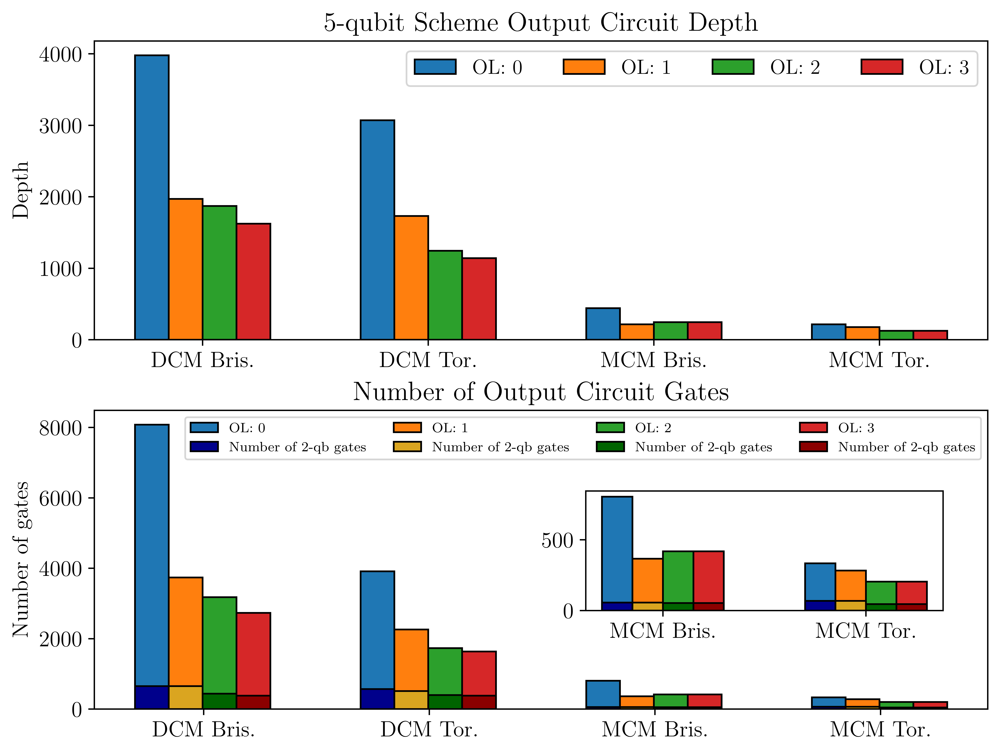

In [14]:
plt.close("all")
scheme = ("DCM Bris.", "DCM Tor.", "MCM Bris.", "MCM Tor.")

depth = {
    'OL: 0':            (3980, 3071, 441, 216),
    'OL: 1':            (1971, 1732, 217, 178),
    'OL: 2':            (1872, 1246, 246, 125),
    'OL: 3':            (1625, 1142, 246, 125)
}


gate_counts = {
    'OL: 0':            (8080, 3914, 804, 334),
    'OL: 1':            (3740, 2263, 366, 282),
    'OL: 2':            (3181, 1733, 418, 204),
    'OL: 3':            (2733, 1637, 418, 204)
}

multiqubit_gate_counts = {
    'OL: 0':            (653, 569, 56, 68),
    'OL: 1':            (653, 513, 56, 68),
    'OL: 2':            (439, 399, 53, 45),
    'OL: 3':            (383, 383, 53, 45)
}

scheme_MCM = ("MCM Bris.", "MCM Tor.")


gate_counts_MCM = {
    'OL: 0':            (804, 334),
    'OL: 1':            (366, 282),
    'OL: 2':            (418, 204),
    'OL: 3':            (418, 204)
}

multiqubit_gate_counts_MCM = {
    'OL: 0':            (56, 68),
    'OL: 1':            (56, 68),
    'OL: 2':            (53, 45),
    'OL: 3':            (53, 45)
}


keys = list(gate_counts)

x = np.arange(len(scheme))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0
hatches = ['/', '+', 'x', 'o']
#colors = ['white', 'lightgray', 'silver', 'darkgray', 'dimgray', 'black']
#colors = ['white', 'lightgray', 'darkgray', 'dimgray', 'black']
colors = ['darkblue', 'goldenrod', 'darkgreen', 'darkred']

#fig, = plt.subplots()
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6), layout='constrained')

for attribute, measurement in gate_counts.items():
    offset = width * multiplier
    rects = ax1.bar(x + offset, list(depth.values())[list(depth.keys()).index(attribute)], width, label=attribute, capsize=3, edgecolor='black')
    rects = ax2.bar(x + offset, measurement, width, label=attribute, capsize=3, edgecolor='black')
    rects = ax2.bar(x + offset, list(multiqubit_gate_counts.values())[list(gate_counts.keys()).index(attribute)], width, 
                    label="Number of 2-qb gates", capsize=3, color=colors[list(depth.keys()).index(attribute)], edgecolor='black')
    
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1
    
#hatch=hatches[list(qss_means.keys()).index(attribute)]

ax1.set_ylabel('Depth')
ax1.set_title("5-qubit Scheme Output Circuit Depth")
#ax1.set_xlabel("Optimization Level")
ax1.set_xticks(x + width + 0.075, scheme)
ax1.legend(loc='best', ncols=4, fontsize="12")
#ax2.set_xlabel("Optimization Level")
ax2.set_xticks(x + width + 0.08, scheme)
ax2.set_ylabel("Number of gates")
ax2.legend(loc='best', ncols=4, fontsize="8")
ax2.set_title("Number of Output Circuit Gates")


# Modern Matplotlib inset, positioned relative to ax2.
ax3 = ax2.inset_axes([0.55, 0.33, 0.4, 0.4])

keys_MCM = list(gate_counts_MCM)
x_MCM = np.arange(len(scheme_MCM))

# Reset this for the inset; the main plot loop above has already incremented it.
multiplier = 0
for attribute, measurement in gate_counts_MCM.items():
    offset = width * multiplier
    rects = ax3.bar(x_MCM + offset, measurement, width, label=attribute, capsize=3, edgecolor='black')
    rects = ax3.bar(x_MCM + offset, list(multiqubit_gate_counts_MCM.values())[list(gate_counts.keys()).index(attribute)], width,
                    capsize=3, color=colors[list(depth.keys()).index(attribute)], edgecolor='black')
    
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1

ax3.set_xticks(x_MCM + 1.5 * width, scheme_MCM)
plt.show()
#fig.savefig('5DepthGates.png', bbox_inches='tight', dpi=800)

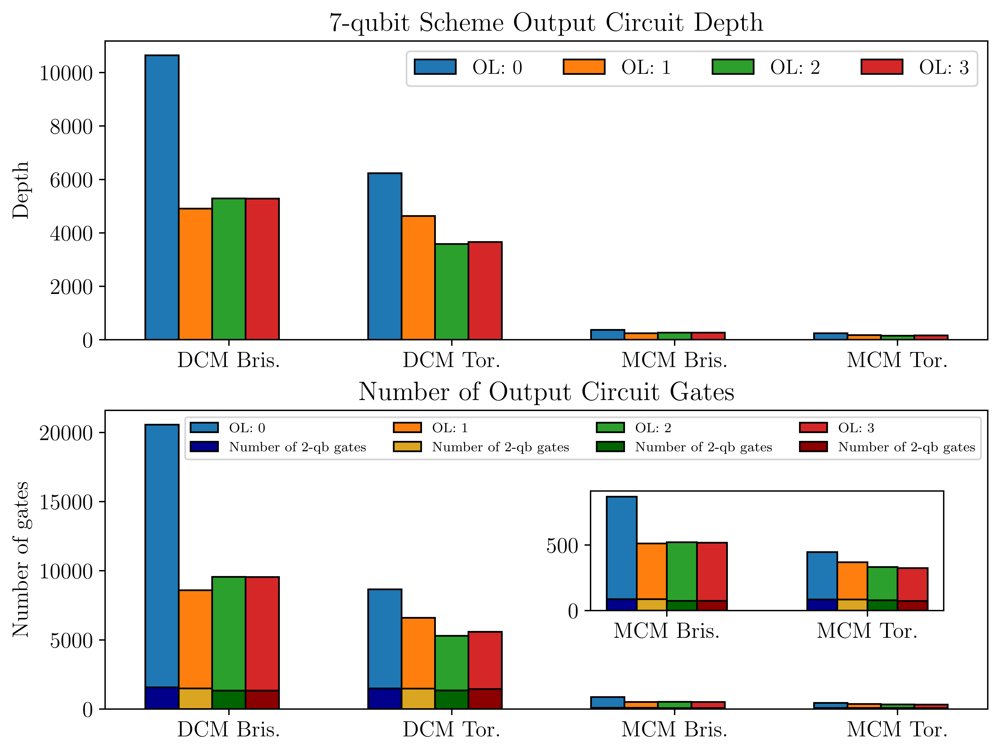

In [15]:
plt.close("all")
scheme = ("DCM Bris.", "DCM Tor.", "MCM Bris.", "MCM Tor.")

depth = {
    'OL: 0':            (10647, 6232, 368, 245),
    'OL: 1':            (4911, 4632, 243, 177),
    'OL: 2':            (5288, 3587, 267, 154),
    'OL: 3':            (5285, 3657, 265, 164)
}


gate_counts = {
    'OL: 0':            (20566, 8658, 869, 446),
    'OL: 1':            (8595, 6602, 512, 369),
    'OL: 2':            (9563, 5298, 521, 332),
    'OL: 3':            (9553, 5591, 518, 324)
}

multiqubit_gate_counts = {
    'OL: 0':            (1570, 1492, 87, 84),
    'OL: 1':            (1495, 1486, 87, 84),
    'OL: 2':            (1342, 1355, 74, 79),
    'OL: 3':            (1342, 1446, 74, 73)
}

scheme_MCM = ("MCM Bris.", "MCM Tor.")


gate_counts_MCM = {
    'OL: 0':            (869, 446),
    'OL: 1':            (512, 369),
    'OL: 2':            (521, 332),
    'OL: 3':            (518, 324)
}

multiqubit_gate_counts_MCM = {
    'OL: 0':            (87, 84),
    'OL: 1':            (87, 84),
    'OL: 2':            (74, 79),
    'OL: 3':            (74, 73)
}

keys = list(gate_counts)

x = np.arange(len(scheme))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0
hatches = ['/', '+', 'x', 'o']
#colors = ['white', 'lightgray', 'silver', 'darkgray', 'dimgray', 'black']
#colors = ['white', 'lightgray', 'darkgray', 'dimgray', 'black']
colors = ['darkblue', 'goldenrod', 'darkgreen', 'darkred']

#fig, = plt.subplots()
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6), layout='constrained')

for attribute, measurement in gate_counts.items():
    offset = width * multiplier
    rects = ax1.bar(x + offset, list(depth.values())[list(depth.keys()).index(attribute)], width, label=attribute, capsize=3, edgecolor='black')
    rects = ax2.bar(x + offset, measurement, width, label=attribute, capsize=3, edgecolor='black')
    rects = ax2.bar(x + offset, list(multiqubit_gate_counts.values())[list(gate_counts.keys()).index(attribute)], width, 
                    label="Number of 2-qb gates", capsize=3, color=colors[list(depth.keys()).index(attribute)], edgecolor='black')
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1
    
#hatch=hatches[list(qss_means.keys()).index(attribute)]

ax1.set_ylabel('Depth')
ax1.set_title("7-qubit Scheme Output Circuit Depth")
#ax1.set_xlabel("Optimization Level")
ax1.set_xticks(x + width + 0.15, scheme)
ax1.legend(loc='best', ncols=4, fontsize="12")
#ax2.set_xlabel("Optimization Level")
ax2.set_xticks(x + width + 0.15, scheme)
ax2.set_ylabel("Number of gates")
ax2.legend(loc='best', ncols=4, fontsize="8")
ax2.set_title("Number of Output Circuit Gates")

# Modern Matplotlib inset, positioned relative to ax2.
ax3 = ax2.inset_axes([0.55, 0.33, 0.4, 0.4])

keys_MCM = list(gate_counts_MCM)
x_MCM = np.arange(len(scheme_MCM))

# Reset this for the inset; the main plot loop above has already incremented it.
multiplier = 0
for attribute, measurement in gate_counts_MCM.items():
    offset = width * multiplier
    rects = ax3.bar(x_MCM + offset, measurement, width, label=attribute, capsize=3, edgecolor='black')
    rects = ax3.bar(x_MCM + offset, list(multiqubit_gate_counts_MCM.values())[list(gate_counts.keys()).index(attribute)], width,
                    capsize=3, color=colors[list(depth.keys()).index(attribute)], edgecolor='black')
    
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1

ax3.set_xticks(x_MCM + 1.5 * width, scheme_MCM)
plt.show()
#fig.savefig('7DepthGates.png', bbox_inches='tight', dpi=800)

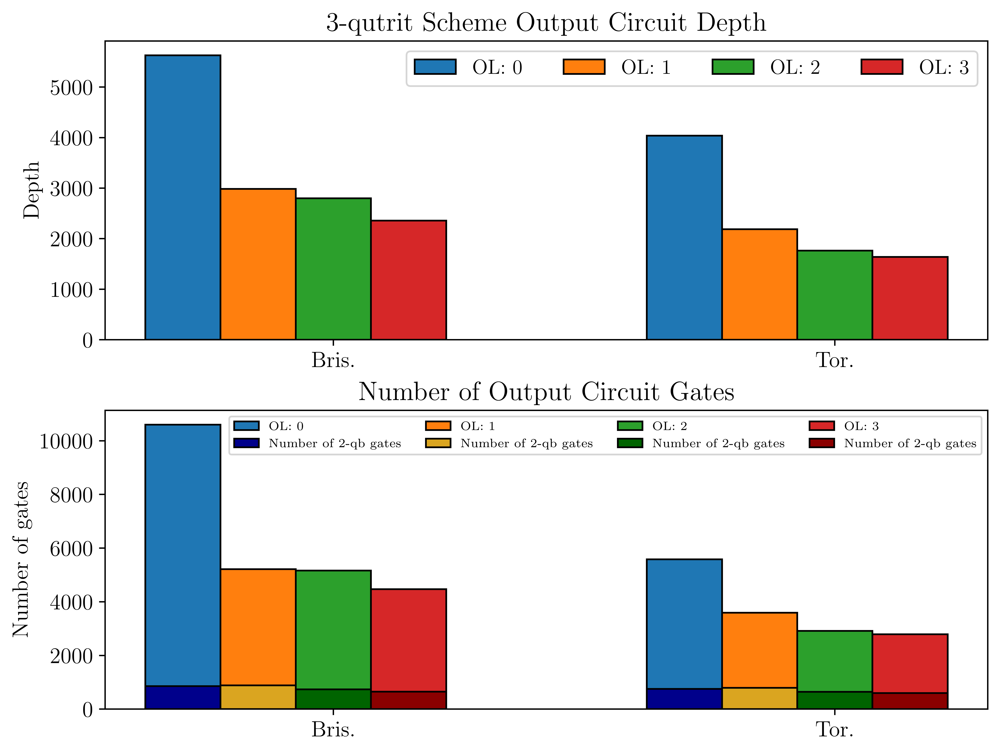

In [16]:
plt.close("all")
scheme = ("Bris.", "Tor.")

depth = {
    'OL: 0':            (5629, 4038),
    'OL: 1':            (2985, 2186),
    'OL: 2':            (2799, 1763),
    'OL: 3':            (2358, 1639)
}


gate_counts = {
    'OL: 0':            (10602, 5581),
    'OL: 1':            (5216, 3593),
    'OL: 2':            (5161, 2915),
    'OL: 3':            (4467, 2791)
}

multiqubit_gate_counts = {
    'OL: 0':            (857, 752),
    'OL: 1':            (884, 796),
    'OL: 2':            (738, 645),
    'OL: 3':            (650, 596)
}

keys = list(gate_counts)

x = np.arange(len(scheme))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0
hatches = ['/', '+', 'x', 'o']
#colors = ['white', 'lightgray', 'silver', 'darkgray', 'dimgray', 'black']
#colors = ['white', 'lightgray', 'darkgray', 'dimgray', 'black']
colors = ['darkblue', 'goldenrod', 'darkgreen', 'darkred']

#fig, = plt.subplots()
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6), layout='constrained')

for attribute, measurement in gate_counts.items():
    offset = width * multiplier
    rects = ax1.bar(x + offset, list(depth.values())[list(depth.keys()).index(attribute)], width, label=attribute, capsize=3, edgecolor='black') 
    rects = ax2.bar(x + offset, measurement, width, label=attribute, capsize=3, edgecolor='black') 
    rects = ax2.bar(x + offset, list(multiqubit_gate_counts.values())[list(gate_counts.keys()).index(attribute)], width, 
                    label="Number of 2-qb gates", capsize=3, color=colors[list(depth.keys()).index(attribute)], edgecolor='black') 
    #ax.bar_label(rects, padding=3, fontsize=5)
    multiplier += 1
    
#hatch=hatches[list(qss_means.keys()).index(attribute)]

ax1.set_ylabel('Depth')
ax1.set_title("3-qutrit Scheme Output Circuit Depth")
ax1.set_xticks(x + width + 0.15, scheme)
ax1.legend(loc='best', ncols=4, fontsize="12")
ax2.set_xticks(x + width + 0.15, scheme)
ax2.set_ylabel("Number of gates")
ax2.legend(loc='best', ncols=4, fontsize="7.2")
ax2.set_title("Number of Output Circuit Gates")

plt.show()
#fig.savefig('3DepthGates.png', bbox_inches='tight', dpi=800)